
# CASE STUDY 2: Malaria Bounding Box

In this case study Images are in .png or .jpg format. There are 2 sets of images consisting of 1208 training and 120 test images.

Labels:
The data consists of two classes of uninfected cells (RBCs and leukocytes) and four classes of infected cells (gametocytes, rings, trophozoites, and schizonts). Annotators were permitted to mark some cells as difficult if not clearly in one of the cell classes. The data had a heavy imbalance towards uninfected RBCs versus uninfected leukocytes and infected cells, making up over 95% of all cells.

A class label and set of bounding box coordinates were given for each cell.



# Problem Statement
This case study is based on Computer Vision. Here, we will use Image segmentation technique. and we will do Object identification + instance segmentation.


Image segmentation creates a pixel-wise mask for each object in the image.
This technique gives us a far more granular understanding of the object in the image.

Task is to identify Malaria cells of each image if they are uninfected cells (RBCs and leukocytes) and four classes of infected cells (gametocytes, rings, trophozoites, and schizonts)


In [54]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Approach
I will train model using Mask-RCNN (Mask Regional Convolutional Neural Network).

I have learnt Mask-RCNN from the below link. It is training Kangaroo object detection dataset.
Some code snippents are taken from the below reference link.
#Ref: https://machinelearningmastery.com/how-to-train-an-object-detection-model-with-keras/


Mask_RCNN gives 3 outputs:
1. Class_ids with Prediction score
2. Objects/Cells Bounding Box
3. Mask for Objects/Cells

# Evaluation Metrics

### mAP: Mean Average Precision
The performance of a model for an object recognition task is often evaluated using the mAP and IOU.
We are predicting bounding boxes so we can determine how well the predicted and actual bounding boxes overlap. This can be calculated by dividing the area of the overlap by the total area of both bounding boxes, or the intersection divided by the union, referred to as “intersection over union,” or IoU. A perfect bounding box prediction will have an IoU of 1.
It is standard to assume a positive prediction of a bounding box if the IoU is greater than 0.5, e.g. they overlap by 50% or more.


Precision refers to the percentage of the correctly predicted bounding boxes (IoU > 0.5) out of all bounding boxes predicted in the image. Recall is the percentage of the correctly predicted bounding boxes (IoU > 0.5) out of all objects in the image.
As we make more predictions, the recall percentage will increase, but precision will drop or become erratic as we start making false positive predictions. The recall (x) can be plotted against the precision (y) for each number of predictions to create a curve or line. We can maximize the value of each point on this line and calculate the average value of the precision or AP for each value of recall.
The average or mean of the average precision (AP) across all of the images in a dataset is called the mean average precision, or mAP.


The mask-rcnn library provides a mrcnn.utils.compute_ap to calculate the AP and other metrics for a given images. These AP scores can be collected across a dataset and the mean calculated to give an idea at how good the model is at detecting objects in a dataset.

### Image Comparision

We will also compare actual images with predicted image with cells class_ids



# Load Libraries

In [ ]:
!pip uninstall tensorflow keras -y
!pip install tensorflow==2.9.0 keras==2.9.0


Found existing installation: tensorflow 2.9.0
Uninstalling tensorflow-2.9.0:
  Successfully uninstalled tensorflow-2.9.0
Found existing installation: keras 2.9.0
Uninstalling keras-2.9.0:
  Successfully uninstalled keras-2.9.0
  Using cached tensorflow-2.9.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (3.0 kB)
  Using cached keras-2.9.0-py2.py3-none-any.whl.metadata (1.3 kB)
Using cached tensorflow-2.9.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (511.7 MB)
Using cached keras-2.9.0-py2.py3-none-any.whl (1.6 MB)


In [ ]:
!pip install git+https://github.com/JahanviGupta17/Mask-RCNN-TF2

  Cloning https://github.com/JahanviGupta17/Mask-RCNN-TF2 to /tmp/pip-req-build-d8e20d1w
  Running command git clone --filter=blob:none --quiet https://github.com/JahanviGupta17/Mask-RCNN-TF2 /tmp/pip-req-build-d8e20d1w
  Resolved https://github.com/JahanviGupta17/Mask-RCNN-TF2 to commit b17ae6c81384e42f2ddb207d1d42a38ebd518d9b
  Preparing metadata (setup.py) ... done


In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import os
import sys
import skimage
import skimage.draw
from skimage.io import imread
from skimage.color import label2rgb
from skimage.transform import resize

# Mask R-CNN related imports
from mrcnn.visualize import display_instances
from mrcnn.utils import extract_bboxes, Dataset, compute_ap
from mrcnn.config import Config

# Remove the problematic import and replace with equivalent TensorFlow operations
# from mrcnn.model import load_image_gt, mold_image

# COCO related imports
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
from pycocotools import mask as maskUtils

# 1. Understanding Data

Data is in form of images.There are 1208 train and 120 test images.
Information of train and test images in in training.json and test.json files.

Example part of training.json:
[{
		"image": {
			"checksum": "676bb8e86fc2dbf05dd97d51a64ac0af",
			"pathname": "/images/8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png",
			"shape": {
				"r": 1200,
				"c": 1600,
				"channels": 3
			}
		},
		"objects": [{
				"bounding_box": {
					"minimum": {
						"r": 1057,
						"c": 1440
					},
					"maximum": {
						"r": 1158,
						"c": 1540
					}
				},
				"category": "red blood cell"
			}, {
				"bounding_box": {
					"minimum": {
						"r": 868,
						"c": 1303
					},
					"maximum": {
						"r": 971,
						"c": 1403
					}
				},
				"category": "red blood cell"

Json file is in objects notation.
1. 'Image' object give pathname, checksum, shape of images(r,c,channels) of image.
2. Object 'Objects' give details of bounding box(minimum and maximum vaue of r and c) of different malaria cells in the image and corresponding category(category is class-id)


### Most important part is to prepare train and test data.

In [ ]:
# Import necessary libraries
import pandas as pd
import os
import json
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive/', force_remount=True)

# Define the malaria directory path
malaria_dir = "/content/drive/MyDrive/ProjectMAL (2)"

# Verify the contents of the malaria directory
print("Contents of the malaria directory:")
print(os.listdir(malaria_dir))


Mounted at /content/drive/
Contents of the malaria directory:
['images', 'mask_rcnn_coco.h5', 'test.json', 'training.json', 'grayscale_train', 'results', 'combined_data.csv']


## 1a: Load training data

In [ ]:
# Path to the 'training.json' file
train_json_path = os.path.join(malaria_dir, 'training.json')

# Check if the training.json file exists
if not os.path.exists(train_json_path):
    print(f"Error: File {train_json_path} does not exist.")
else:
    print("Training file found. Proceeding...")

    # Load the 'training.json' file
    with open(train_json_path, 'r') as f:
        train_data = json.load(f)

    # Convert JSON data to DataFrame
    if isinstance(train_data, list):
        train_df = pd.DataFrame(train_data)
    elif isinstance(train_data, dict) and 'data' in train_data and isinstance(train_data['data'], list):
        train_df = pd.DataFrame(train_data['data'])
    else:
        raise ValueError("Error: Training JSON data format not recognized.")

    # Generate full image paths
    train_df['path'] = train_df['image'].map(lambda x: os.path.join(malaria_dir, x['pathname'][1:]))

    # Define a function to check if the image exists
    def check_image_path(x):
        return os.path.exists(x)

    # Check if images exist
    train_df['image_available'] = train_df['path'].map(check_image_path)

    # Filter out rows where images are not available
    train_df = train_df[train_df['image_available']]
    print(f"Training dataset: {train_df.shape[0]} images available")

    # Print the first few rows of the training dataset
    print("Filtered Training DataFrame (first 5 rows):")
    print(train_df.head())


Training file found. Proceeding...
Training dataset: 1208 images available
Filtered Training DataFrame (first 5 rows):
                                               image  \
0  {'checksum': '676bb8e86fc2dbf05dd97d51a64ac0af...   
1  {'checksum': '1225a18efce159eddf7b0e80e0ea642c...   
2  {'checksum': '3eaf840523c30fdf38897ffa01e194eb...   
3  {'checksum': '8a111dffacfa433029492780b9535091...   
4  {'checksum': 'ccef403e971460b86444cca669e68ca1...   

                                             objects  \
0  [{'bounding_box': {'minimum': {'r': 1057, 'c':...   
1  [{'bounding_box': {'minimum': {'r': 734, 'c': ...   
2  [{'bounding_box': {'minimum': {'r': 724, 'c': ...   
3  [{'bounding_box': {'minimum': {'r': 563, 'c': ...   
4  [{'bounding_box': {'minimum': {'r': 618, 'c': ...   

                                                path  image_available  
0  /content/drive/MyDrive/ProjectMAL (2)/images/8...             True  
1  /content/drive/MyDrive/ProjectMAL (2)/images/1...           

## 1b. Load test data

In [ ]:
# Path to the 'test.json' file
test_json_path = os.path.join(malaria_dir, 'test.json')

# Check if the test.json file exists
if not os.path.exists(test_json_path):
    print(f"Error: File {test_json_path} does not exist.")
else:
    print("Testing file found. Proceeding...")

    # Load the 'test.json' file
    test_df = pd.read_json(test_json_path)

    # Generate full image paths
    test_df['path'] = test_df['image'].map(lambda x: os.path.join(malaria_dir, x['pathname'][1:]))

    # Extract image name and create unique IDs
    test_df['image_name'] = test_df['image'].map(lambda x: x['pathname'][8:])
    test_df['image_id'] = test_df.index + 1208

    # Check if images exist
    test_df['image_available'] = test_df['path'].map(lambda x: os.path.exists(x))

    # Filter out rows where images are not available
    test_df = test_df[test_df['image_available']]
    print(f"Testing dataset: {test_df.shape[0]} images available")

    # Print the first few rows of the testing dataset
    print("Filtered Testing DataFrame (first 5 rows):")
    print(test_df.head())


Testing file found. Proceeding...
Testing dataset: 120 images available
Filtered Testing DataFrame (first 5 rows):
                                               image  \
0  {'checksum': 'eea3bfd6a929bcb06f9786667cd3fbb2...   
1  {'checksum': '2d85fc8ffdb875bb569878243437e4f5...   
2  {'checksum': 'f7c02b6247f3ccfcd4a22c1f06e0c72c...   
3  {'checksum': '50634ef166ae993b4562b96f315ff6db...   
4  {'checksum': '74dd777a74e5a4b24aaee574a99e1459...   

                                             objects  \
0  [{'bounding_box': {'minimum': {'r': 576, 'c': ...   
1  [{'bounding_box': {'minimum': {'r': 1048, 'c':...   
2  [{'bounding_box': {'minimum': {'r': 979, 'c': ...   
3  [{'bounding_box': {'minimum': {'r': 402, 'c': ...   
4  [{'bounding_box': {'minimum': {'r': 314, 'c': ...   

                                                path  \
0  /content/drive/MyDrive/ProjectMAL (2)/images/4...   
1  /content/drive/MyDrive/ProjectMAL (2)/images/6...   
2  /content/drive/MyDrive/ProjectMAL (2)/im

In [ ]:
# Align the columns between training and testing datasets
# Add missing columns to train_df
if 'image_name' not in train_df.columns:
    train_df['image_name'] = None  # Default value for missing column
if 'image_id' not in train_df.columns:
    train_df['image_id'] = train_df.index  # Assign unique IDs based on index

# Add missing columns to test_df if needed
if 'objects' not in test_df.columns:
    test_df['objects'] = None  # Default value for missing column if necessary

# Print the aligned columns
print("Aligned Train Columns:", train_df.columns)
print("Aligned Test Columns:", test_df.columns)
# Extract image_name from the 'path' column
train_df['image_name'] = train_df['path'].map(lambda x: os.path.basename(x))

# Verify the updated DataFrame
print("Updated Train DataFrame (first 5 rows):")
print(train_df.head())


Aligned Train Columns: Index(['image', 'objects', 'path', 'image_available', 'image_name',
       'image_id'],
      dtype='object')
Aligned Test Columns: Index(['image', 'objects', 'path', 'image_name', 'image_id',
       'image_available'],
      dtype='object')
Updated Train DataFrame (first 5 rows):
                                               image  \
0  {'checksum': '676bb8e86fc2dbf05dd97d51a64ac0af...   
1  {'checksum': '1225a18efce159eddf7b0e80e0ea642c...   
2  {'checksum': '3eaf840523c30fdf38897ffa01e194eb...   
3  {'checksum': '8a111dffacfa433029492780b9535091...   
4  {'checksum': 'ccef403e971460b86444cca669e68ca1...   

                                             objects  \
0  [{'bounding_box': {'minimum': {'r': 1057, 'c':...   
1  [{'bounding_box': {'minimum': {'r': 734, 'c': ...   
2  [{'bounding_box': {'minimum': {'r': 724, 'c': ...   
3  [{'bounding_box': {'minimum': {'r': 563, 'c': ...   
4  [{'bounding_box': {'minimum': {'r': 618, 'c': ...   

                     

In [ ]:
# combine train and test dataset
frames = [train_df, test_df]

result_df = pd.concat(frames,ignore_index=True)
result_df[1:3]

,image,objects,path,image_available,image_name,image_id
1,{'checksum': '1225a18efce159eddf7b0e80e0ea642c...,"[{'bounding_box': {'minimum': {'r': 734, 'c': ...",/content/drive/MyDrive/ProjectMAL (2)/images/1...,True,10be6380-cbbb-4886-8b9e-ff56b1710576.png,1
2,{'checksum': '3eaf840523c30fdf38897ffa01e194eb...,"[{'bounding_box': {'minimum': {'r': 724, 'c': ...",/content/drive/MyDrive/ProjectMAL (2)/images/6...,True,6b14c855-8561-417c-97a4-63fa552842fd.png,2


# 2. Extract bounding boxes details
from json for traing and test data

In [ ]:

object_df = pd.DataFrame([dict(image_id=c_row['image_id'],image_name=c_row['image_name'],path=c_row['path'], **c_item) for _, c_row in result_df.iterrows() for c_item in c_row['objects']])
cat_dict = {v:k for k,v in enumerate(object_df['category'].value_counts().index, 1)}
print(object_df['category'].value_counts())
object_df.sample(3)

print(object_df.shape)
print(object_df.head())


category
red blood cell    83034
trophozoite        1584
ring                522
difficult           446
schizont            190
gametocyte          156
leukocyte           103
Name: count, dtype: int64
(86035, 5)
   image_id                                image_name  \
0         0  8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png   
1         0  8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png   
2         0  8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png   
3         0  8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png   
4         0  8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png   

                                                path  \
0  /content/drive/MyDrive/ProjectMAL (2)/images/8...   
1  /content/drive/MyDrive/ProjectMAL (2)/images/8...   
2  /content/drive/MyDrive/ProjectMAL (2)/images/8...   
3  /content/drive/MyDrive/ProjectMAL (2)/images/8...   
4  /content/drive/MyDrive/ProjectMAL (2)/images/8...   

                                        bounding_box        category  
0  {'minimum': {'r': 1057, 'c': 144

In [ ]:
# breaking bounding box in to r_min, c_min , r_max and c_max

object_df['min_bounding_box'] = object_df['bounding_box'].map(lambda x: x['minimum'])
object_df['r_min'] = object_df['min_bounding_box'].map(lambda x: x['r'])
object_df['c_min'] = object_df['min_bounding_box'].map(lambda x: x['c'])
object_df['max_bounding_box'] = object_df['bounding_box'].map(lambda x: x['maximum'])
object_df['r_max'] = object_df['max_bounding_box'].map(lambda x: x['r'])
object_df['c_max'] = object_df['max_bounding_box'].map(lambda x: x['c'])



In [ ]:
# removing columns  bounding_box, min_bounding_box and max_bounding_box
object_df = object_df.drop(['bounding_box','min_bounding_box','max_bounding_box'], axis=1) # Changed: axis=1 as keyword argument
object_df = object_df[['image_id','image_name','path','r_min','c_min','r_max','c_max','category']]
object_df.head()


,image_id,image_name,path,r_min,c_min,r_max,c_max,category
0,0,8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png,/content/drive/MyDrive/ProjectMAL (2)/images/8...,1057,1440,1158,1540,red blood cell
1,0,8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png,/content/drive/MyDrive/ProjectMAL (2)/images/8...,868,1303,971,1403,red blood cell
2,0,8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png,/content/drive/MyDrive/ProjectMAL (2)/images/8...,578,900,689,1008,red blood cell
3,0,8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png,/content/drive/MyDrive/ProjectMAL (2)/images/8...,304,611,408,713,red blood cell
4,0,8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png,/content/drive/MyDrive/ProjectMAL (2)/images/8...,198,881,312,1003,red blood cell


In [ ]:
object_df['path'][4]

'/content/drive/MyDrive/ProjectMAL (2)/images/8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png'

In [ ]:
# creating dataset of all images
dataset=result_df[['image_id','image_name','path']]
dataset.head()


,image_id,image_name,path
0,0,8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png,/content/drive/MyDrive/ProjectMAL (2)/images/8...
1,1,10be6380-cbbb-4886-8b9e-ff56b1710576.png,/content/drive/MyDrive/ProjectMAL (2)/images/1...
2,2,6b14c855-8561-417c-97a4-63fa552842fd.png,/content/drive/MyDrive/ProjectMAL (2)/images/6...
3,3,13099edb-35d9-438f-b093-2cf2ebf9d255.png,/content/drive/MyDrive/ProjectMAL (2)/images/1...
4,4,2559636b-f01a-4414-93da-210c3b12d153.png,/content/drive/MyDrive/ProjectMAL (2)/images/2...


# 3. Output Classes

In [ ]:
# Class IDs
print(cat_dict)
cat_dict['red blood cell']
dict={1:'red blood cell', 2:'trophozoite', 3:'difficult', 4:'ring', 5:'schizont', 6:'gametocyte',7: 'leukocyte'}

{'red blood cell': 1, 'trophozoite': 2, 'ring': 3, 'difficult': 4, 'schizont': 5, 'gametocyte': 6, 'leukocyte': 7}


In [ ]:
import os.path
def path_exists(filename):
    if not os.path.exists(filename):
        return(malaria_dir + "/images/"+ filename)
    else:
        return(filename)

In [ ]:
path_exists("00a02700-2ea2-4590-9e15-ffc9160fd3de.jpg")

'/content/drive/MyDrive/ProjectMAL (2)/images/00a02700-2ea2-4590-9e15-ffc9160fd3de.jpg'

# 4. Write different functions of Mask-RCNN

Mask R-CNN is used for Instance Segmentation. In Instance Segmentation different instances of the same class are segmented individually.
Bounding box of many objects overlap with each other. So mask helps in detecting exact shape of object.

The Mask R-CNN is a pixel level image segmentation.

### Loss Function in Mask R-CNN:
Loss in Mask R-CNN is consists of loss due to RPN(Regional Proposed Network) and loss due to classification, localization and segmentation mask.

1. Loss(RPN)= RPN_Class Loss + RPN_BBox Loss

2. Loss(Mask R-CNN)= Loss(class labels prediction) + Loss(Bounding Box prediction) + Loss (Mask Prediction)


#### Total Loss= Loss(RPN) +  Loss(Mask R-CNN)



Here, we are writing all functions for Mask-RCNN and try them for single image.
Then we  enclosed these functions in a class and use for entire dataset

In [ ]:
def extract_boxes(filename):
    """Function to extract bounding boxes from training/test json file

        Returns:
            List of boxes, array of class_id of boxes, width and height of image
    """
    #to convert if input is path or file.. if file chnage it in topath
    filename=path_exists(filename)
    # extract each bounding box
    boxes = list()
    class_id = list()
    img= imread(filename)
    #for n in range(0,dataset.shape[0]):
    df=[]
    df=(object_df.loc[object_df['path'] == filename])

    for  i,bbox in df.iterrows():
        coors = [bbox['c_min'], bbox['r_min'], bbox['c_max'], bbox['r_max']]
        boxes.append(coors)
        class_id.append(bbox['category'])
    # extract image dimensions
    width = img.shape[1]
    height = img.shape[0]
    return boxes, class_id,width, height

In [ ]:
print(extract_boxes.__doc__)

Function to extract bounding boxes from training/test json file

        Returns:
            List of boxes, array of class_id of boxes, width and height of image
    


In [ ]:
boxes,class_id,w,h = extract_boxes("10be6380-cbbb-4886-8b9e-ff56b1710576.png")
print(class_id,w,h,boxes)

['red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red bloo

In [ ]:
# load the masks for an image
def load_mask(path):
    """Load instance masks for the given image.

        Returns:
            masks: A bool array of shape [height, width, instance count] with
                a binary mask per instance.
            class_ids: a 1D array of class IDs of the instance masks.
        """

    #to convert if input is path or file.. if file chnage it in topath
    path=path_exists(path)

    # load XML
    boxes, class_ids, w, h = extract_boxes(path)
    # create one array for all masks, each on a different channel
    masks = np.zeros([h, w, len(boxes)], dtype='uint8')
    # create masks
    for i in range(len(boxes)):
        box = boxes[i]
        row_s, row_e = box[1], box[3]
        col_s, col_e = box[0], box[2]
        masks[row_s:row_e, col_s:col_e, i] = 1
    return masks, np.asarray(class_ids)


In [ ]:

masks,class_ids = load_mask(dataset['path'][1])
print(class_id,masks)

['red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red blood cell', 'red bloo

In [ ]:
def load_image(path):
    """Load the specified image and return a [H,W,3] Numpy array.
    """
    #to convert if input is path or file.. if file chnage it in topath
    path=path_exists(path)
    # Load image
    image = imread(path)
    # If grayscale. Convert to RGB for consistency.
    if image.ndim != 3:
        image = skimage.color.gray2rgb(image)
    # If has an alpha channel, remove it for consistency
    if image.shape[-1] == 4:
        image = image[..., :3]
    return image

In [ ]:
img_path = "/content/drive/MyDrive/ProjectMAL (2)/images/8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png"
img = load_image(img_path)

(1200, 1600, 3)
(1200, 1600, 61)


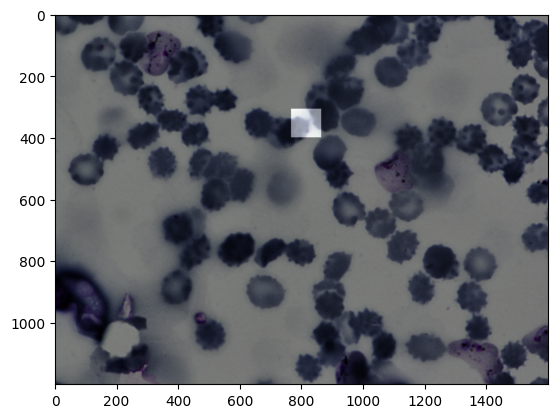

In [ ]:
print(img.shape)
print(masks.shape)
# plot image
plt.imshow(img)
# plot mask
plt.imshow(masks[:, :, 3], cmap='gray', alpha=0.5)
#plt.show()

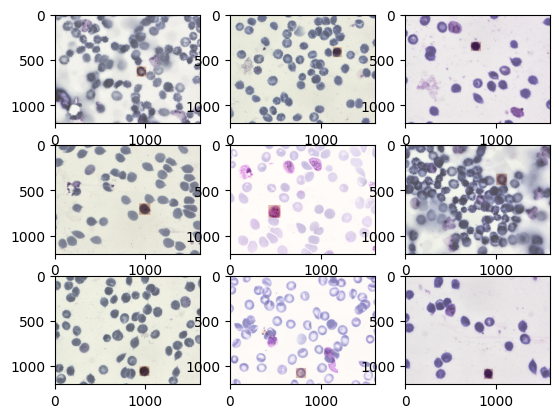

In [ ]:
# plot first few images
for i in range(9):
    # define subplot
    plt.subplot(330+1+i)


    # plot raw pixel data
    image = load_image(dataset['path'][i])
    plt.imshow(image)
    # plot all masks
    mask, _ = load_mask(dataset['path'][i])

   # for j in range(mask.shape[2]):
    plt.imshow(mask[:, :, 2], cmap='Oranges', alpha=0.3)

# show the figure
plt.show()

In [ ]:
image.shape[:2]

(1200, 1600)

(1200, 1600)
(1200, 1600, 42)


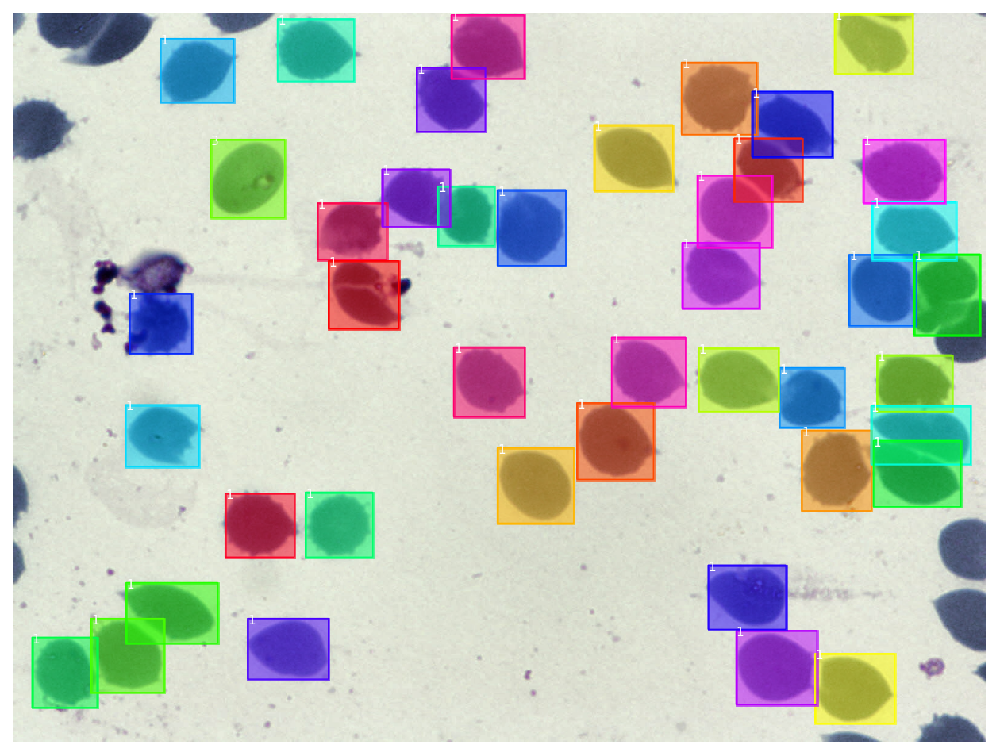

In [ ]:
# display mask , bounding box of all objects of a image
image_id = dataset['path'][3]
# load the image
image = load_image(image_id)
print(image.shape[:2])
# load the masks and the class ids
mask, class_ids = load_mask(image_id)
print(mask.shape)
# extract bounding boxes from the masks
bbox = extract_bboxes(mask)
#print(class_ids)
# display image with masks and bounding boxes
display_instances(image, bbox, mask, class_ids, cat_dict)

# 5. Prepare dataset with bounding box information

In [ ]:
import os
class MalariaDataset(Dataset):
    # load the dataset definitions
    def load_dataset(self, dataset_dir, is_train):
        """ Load the train/test dataset.
        dataset_dir: directory of image
        is_train: if true load train dataset else test dataset
        """
        if (is_train):
            print("Loading Train dataset" )
        else:
            print("Loading Test dataset" )
        # define classes
        self.add_class('dataset', 1, "red blood cell")
        self.add_class('dataset', 2, "trophozoite")
        self.add_class('dataset', 3, "difficult")
        self.add_class('dataset', 4, "ring")
        self.add_class('dataset', 5, "schizont")
        self.add_class('dataset', 6, "gametocyte")
        self.add_class('dataset', 7, "leukocyte")

        # define data locations
        images_dir = dataset_dir + '/images/'


        length = len(os.listdir(images_dir))  # Fixed: Use os.listdir instead of listdir
        print(f"Found {length} images in the dataset.")
        for filename in os.listdir(images_dir):  # Fixed: Use os.listdir instead of listdir
            # extract image id
            image_id = dataset.image_id[dataset['image_name'] == filename].values

            # skip all images after 1207 if we are building the train set
            if is_train and image_id >= 1208:
                continue
            # skip all images before 1207 if we are building the test/val set
            if not is_train and image_id < 1208:
                continue
            img_path = images_dir + filename
            # add to dataset
            self.add_image('dataset', image_id=image_id, path=img_path)

    def load_image(self, image_id):
        """Load the specified image and return a [H,W,3] Numpy array.
        """
        #print("Loading image: ", image_id)
        # Load image
        for info in self.image_info:
            if info["id"] == image_id or info["id"] == image_id+1208:
                #print("Loading image: ",info["id"], " ",info['path'])
                img = skimage.io.imread(info['path'])


       # image = skimage.io.imread(self.image_info[image_id]['path'])
        # If grayscale. Convert to RGB for consistency.
        if img.ndim != 3:
            img = skimage.color.gray2rgb(img)
        # If has an alpha channel, remove it for consistency
        if img.shape[-1] == 4:
            img = img[..., :3]
        return img


    def extract_boxes(self,image_id):
        """Function to extract bounding boxes from training/test json file

        Returns:
            List of boxes, array of class_id of boxes, width and height of image
        """

        boxes = list()
        class_id = list()
        for info in self.image_info:
            if info["id"] == image_id or info["id"] == image_id+1208:
                #print("Extracting image: ",info["id"], " ",info['path'])
                img = skimage.io.imread(info['path'])
                image_id=info["id"]
                image_id=image_id[0]


        df=[]
        df=(object_df.loc[object_df['image_id'] == image_id])
        #print("df: ",df)

        for  i,bbox in df.iterrows():
            coors = [bbox['c_min'], bbox['r_min'], bbox['c_max'], bbox['r_max']]
            boxes.append(coors)
            class_id.append(cat_dict[bbox['category']])
        # extract image dimensions
        width = img.shape[1]
        height = img.shape[0]
        return boxes, class_id,width, height


    # load the masks for an image
    def load_mask(self,image_id):
        """Load instance masks for the given image.

        Returns:
            masks: A bool array of shape [height, width, instance count] with
                a binary mask per instance.
            class_ids: a 1D array of class IDs of the instance masks.
        """
        boxes, class_ids, w, h = self.extract_boxes(image_id)

        #print(class_ids)
        # create one array for all masks, each on a different channel
        masks = np.zeros([h, w, len(boxes)], dtype='uint8')

        # create masks

        for i in range(len(boxes)):
            box = boxes[i]
            row_s, row_e = box[1], box[3]
            col_s, col_e = box[0], box[2]
            masks[row_s:row_e, col_s:col_e, i] = 1

        return masks, np.asarray(class_ids)


    # load an image reference
    def image_reference(self, image_id):
        """Return image info i.e path of that image
        """
        info = self.image_info[image_id]
        return info['path']


In [ ]:
# prepare train set
train_set = MalariaDataset()
train_set.load_dataset(malaria_dir, is_train=True)
train_set.prepare()

test_set = MalariaDataset()
test_set.load_dataset(malaria_dir, is_train=False)
test_set.prepare()
#[12] 065af549-320a-4862-b92a-8ef750d7b5fb.png

Loading Train dataset
Found 1328 images in the dataset.
Loading Test dataset
Found 1328 images in the dataset.


[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


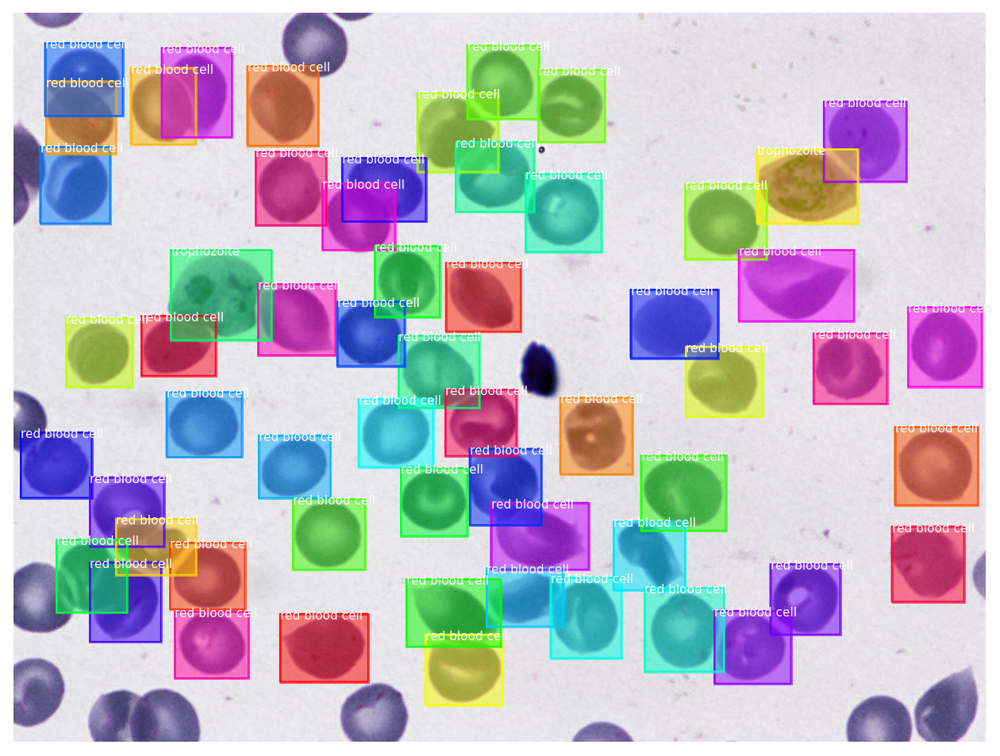

In [ ]:
# Test code to check if image loading, masking and boxing works properly on not
# load an image
image_id = 12
image = train_set.load_image(image_id)
#plt.imshow(image)
#print(image.shape)
# load image mask
mask, class_ids = train_set.load_mask(image_id)
#print(mask.shape)
#plt.imshow(image)
#plt.title('Actual')
# plot masks
#print(mask.shape[2])
#for j in range(mask.shape[2]):
#plt.imshow(mask[:, :, 5], cmap='gray', alpha=0.3)
print(class_ids)
bbox = extract_bboxes(mask)
# display image with masks and bounding boxes

display_instances(image, bbox, mask, class_ids,  dict,show_mask=True,show_bbox=True)

molded_image             shape: (1024, 1024, 3)       min:    0.00000  max:  253.00000  uint8
mask                     shape: (1024, 1024, 58)      min:    0.00000  max:    1.00000  uint8


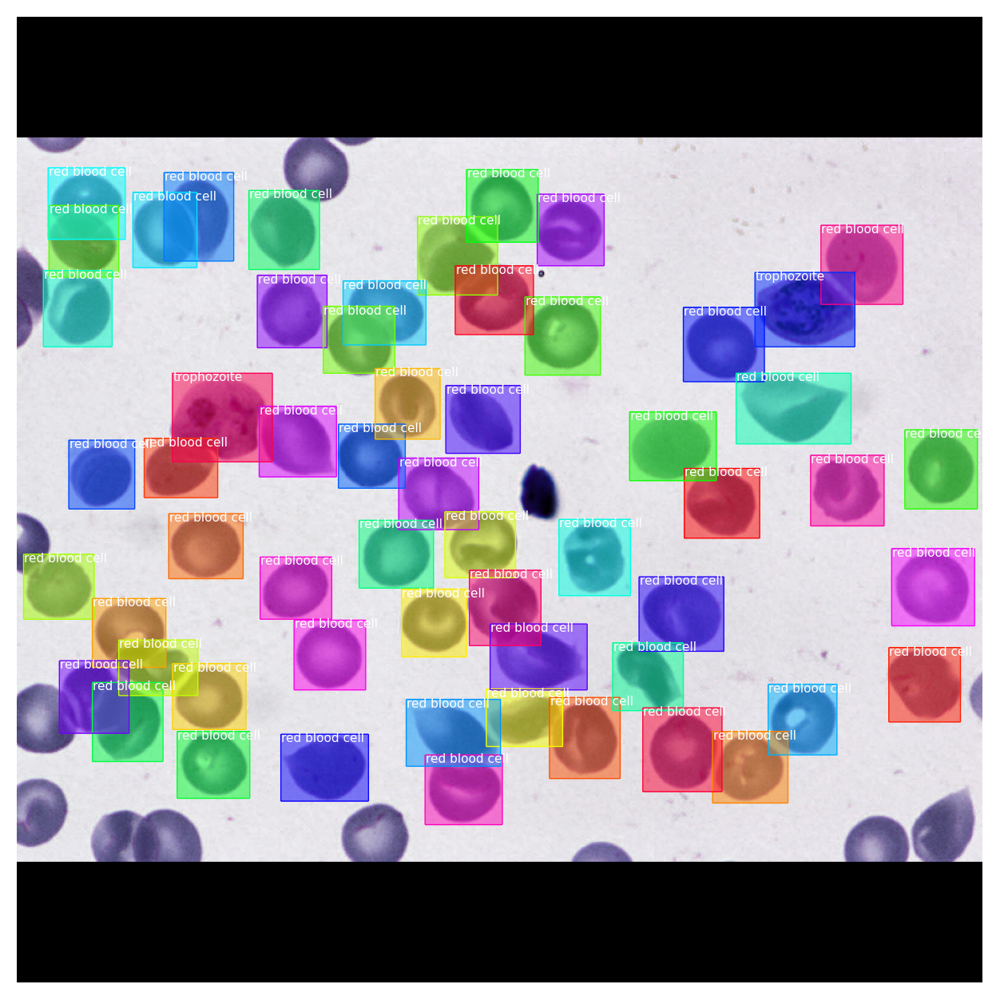

In [ ]:
# First, import keras
import tensorflow.keras as keras

# Now import mrcnn
import mrcnn.model as modellib
from mrcnn.model import log

# Load and display using mrcnn model which is internally called all functions
from mrcnn.config import Config

# Define your custom configuration class
class CustomConfig(Config):
    NAME = "mask_rcnn_custom"
    IMAGES_PER_GPU = 2  # Number of images per GPU
    NUM_CLASSES = 1 + len(train_set.class_names)  # One for background
    GPU_COUNT = 1
    IMAGE_MIN_DIM = 800
    IMAGE_MAX_DIM = 1024
    RPN_ANCHOR_SCALES = (32, 64, 128, 256, 512)
    STEPS_PER_EPOCH = 100
    VALIDATION_STEPS = 5
    LEARNING_RATE = 0.001
    BATCH_SIZE = 2

# Instantiate the configuration
config = CustomConfig()

# Now call the load_image_gt function using config
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    train_set, config, image_id=12, use_mini_mask=False)
log("molded_image", image)
log("mask", mask)
display_instances(image, bbox, mask, class_ids, train_set.class_names, show_bbox=False, show_mask=True)


In [ ]:
print('Train: %d' % len(train_set.image_ids))
print('Test: %d' % len(test_set.image_ids))

Train: 1208
Test: 120


In [ ]:
# enumerate all images in the dataset
for image_id in train_set.image_ids:
	# load image info
	info = train_set.image_info[image_id]
	# display on the console
print(info)

{'id': array([694]), 'source': 'dataset', 'path': '/content/drive/MyDrive/ProjectMAL (2)/images/419309ef-da3f-4424-93cf-01ff4c52b017.png'}


# 6. Define configuration for model training

In [ ]:
from mrcnn.config import Config

class MalariaConfig(Config):
    # Name of the configuration (can be anything, this is for your reference)
    NAME = "malaria_cfg"

    # Number of classes (including background class)
    NUM_CLASSES = 8  # Background + 7 other classes (change this based on your dataset)

    # Number of images to process per GPU in one batch
    IMAGES_PER_GPU = 2

    # Number of training steps per epoch (adjust to your dataset size)
    STEPS_PER_EPOCH = 500

    # Image size (keep it a square)
    IMAGE_MAX_DIM = 512
    IMAGE_MIN_DIM = 512

    # Backbone network to use for feature extraction
    BACKBONE = "resnet50"  # Could be resnet101, etc.

    # Number of anchors and their scales
    RPN_ANCHOR_SCALES = (32, 64, 128, 256, 512)  # Customize if needed

    # Learning rate for training
    LEARNING_RATE = 0.001

    # Image resizing mode
    IMAGE_RESIZE_MODE = "square"  # Options: "square", "crop", or "pad"

    # Whether to use RPN ROIs for training (set to True to use RPN)
    USE_RPN_ROIS = True

    # Shape of the input image, to match the defined image dimensions
    IMAGE_SHAPE = (IMAGE_MAX_DIM, IMAGE_MAX_DIM, 3)

    # Maximum number of ground truth instances per image
    MAX_GT_INSTANCES = 100

    # Maximum number of detections to return during inference
    DETECTION_MAX_INSTANCES = 100

    # Train only the heads (the last layers) for faster training
    LAYERS = "heads"  # "all" or "3+" or "heads"

    def __init__(self, num_classes):
        # The super() call initializes the base class Config's attributes.
        super().__init__()
        self.NUM_CLASSES = num_classes
        # Set the custom attributes for your configuration
        self.NUM_CLASSES = num_classes
        self.STEPS_PER_EPOCH = 500
        self.IMAGE_MAX_DIM = 512
        self.IMAGE_MIN_DIM = 512

        # If needed, set other custom parameters (like learning rate)
        self.LEARNING_RATE = 0.001

# Create the config object
config.display()  # Display the config settings



Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                20
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [ ]:
import tensorflow as tf

# Enable GPU memory growth (avoid allocating all memory at once)
physical_devices = tf.config.list_physical_devices('GPU')
if physical_devices:
    try:
        # Set memory growth for the GPU
        tf.config.experimental.set_memory_growth(physical_devices[0], True)
        print("Memory growth enabled on the GPU.")
    except RuntimeError as e:
        print(e)


# 7. Train the model


To train the model using predefined weights.The first step is to download the model file (architecture and weights) for the pre-fit Mask R-CNN model.
Download the model weights to a file with the name ‘mask_rcnn_coco.h5‘ from matterplot github directory of Mask R-CNN, in your current working directory.
Load weight mask_rcnn_coco.h5 which we have downloaded.

Then, define the model by creating an instance of the mrcnn.model.MaskRCNN class and specifying the model will be used for training via setting the ‘mode‘ argument to ‘training‘ and use config which we define above.

In [ ]:
from mrcnn.model import MaskRCNN
config = MalariaConfig(num_classes=8)

# Initialize the model
model = MaskRCNN(mode='training', model_dir='./', config=config)

# Load weights (mscoco) and exclude the output layers (if necessary)
model.load_weights('mask_rcnn_coco.h5', by_name=True, exclude=["mrcnn_class_logits", "mrcnn_bbox_fc",  "mrcnn_bbox", "mrcnn_mask"])

# Train the model
model.train(train_set, test_set, learning_rate=config.LEARNING_RATE, epochs=5, layers='heads')


TypeError: Could not build a TypeSpec for KerasTensor(type_spec=TensorSpec(shape=(None, None, 4), dtype=tf.float32, name=None), name='tf.math.truediv_3/truediv:0', description="created by layer 'tf.math.truediv_3'") of unsupported type <class 'keras.engine.keras_tensor.KerasTensor'>.

# 8. Define configuration for Prediction
Define new configuration for evaluating model.

In [ ]:
# Predict for test dataset
# define the prediction configuration
class PredictionConfig(Config):

    # Setting other parameters...

    def __init__(self, num_classes):
        self.NAME = "malaria_cfg"
        self.NUM_CLASSES = num_classes
        self.GPU_COUNT = 1
        self.IMAGES_PER_GPU = 1
        self.STEPS_PER_EPOCH=500
        self.IMAGE_MAX_DIM=512
        self.IMAGE_MIN_DIM=512

        super().__init__()

config_pred = PredictionConfig(8)
config_pred.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                20
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE             

# 9. Evaluate the model by Plotting actual and predicted image

In [ ]:
def plot_actual_vs_predicted(dataset, model, cfg, n_images):
    # load image and mask
    for i in range(n_images):
        print(dataset.image_info[i]["path"])
        # load the image and mask
        image = dataset.load_image(i)
        mask, class_ids = dataset.load_mask(i)
        bbox = extract_bboxes(mask)
        # define subplot
       # _, ax = plt.subplots(n_images, 2, i*2+1)

        display_instances(image, bbox, mask,class_ids,dataset.class_names,title="Actual",figsize=(8, 8),show_mask=False)

        #Predicted image
        #Define subplot
        #_,ax=plt.subplot(n_images, 2, i*2+2)
        # convert pixel values (e.g. center)
        scaled_image = mold_image(image, cfg)
        # convert image into one sample
        sample = expand_dims(scaled_image, 0)
        # make prediction
        yhat = model.detect(sample, verbose=0)[0]

        # Visualize results
        r = yhat
        display_instances(image, r['rois'], r['masks'], r['class_ids'],
                           dataset.class_names, r['scores'],title="Predicted",figsize=(8, 8))


### Evalating model
Define the model with the config_pred and set the ‘mode‘ argument to ‘inference‘ instead of ‘training‘.
Then, load the weights from our saved model file ‘mask_rcnn_kangaroo_cfg_0005.h5‘ in the current working directory.

Then, we will plot actual and predicted images of some images.

In [ ]:
import warnings
warnings.filterwarnings("ignore")
# create config
config_pred = PredictionConfig(num_classes=8)
# define the model
model_eval = MaskRCNN(mode='inference', model_dir='./', config=config_pred)
# load model weights
model_eval.load_weights('mask_rcnn_malaria_cfg_0005.h5', by_name=True)
# plot predictions for train dataset
plot_actual_vs_predicted(train_set, model_eval, config_pred, n_images=4)


ValueError: Exception encountered when calling layer "mrcnn_bbox" (type Reshape).

Tried to convert 'shape' to a tensor and failed. Error: None values not supported.

Call arguments received by layer "mrcnn_bbox" (type Reshape):
  • inputs=tf.Tensor(shape=(1, None, 32), dtype=float32)

C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/010961af-b38c-49de-aca0-e3732d73d414.jpg
Loading image:  [1208]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/41be1bd3-0d31-4881-bf1f-3ccdfa21ff12.jpg


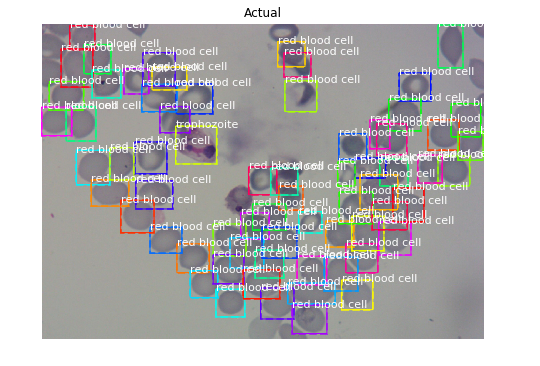

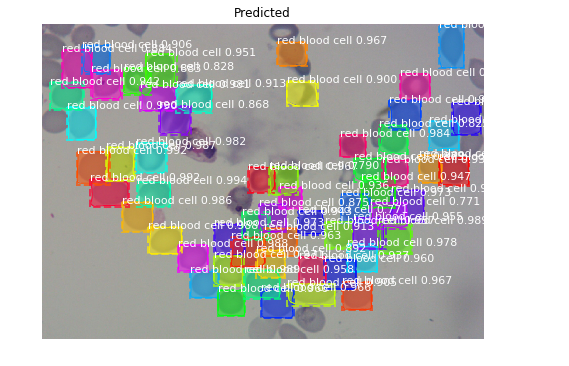

C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/0346611b-ea43-45bd-9f16-c6e8086273d2.jpg
Loading image:  [1209]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/64985a1e-16bb-4016-a01c-c21a5b86e572.jpg


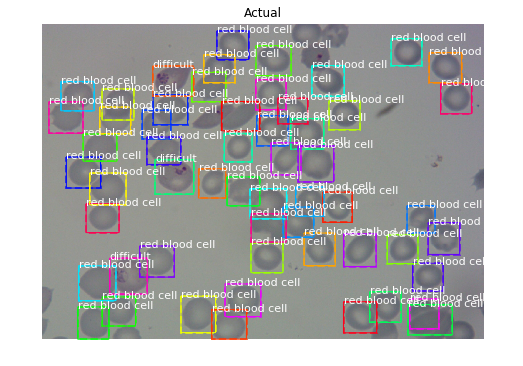

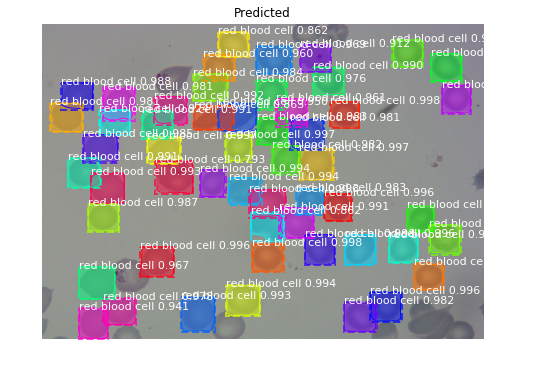

C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/03be08c8-2cf3-4de6-8ac6-5f7817a6a643.jpg
Loading image:  [1210]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/c70894fa-50e8-4eed-a5a8-159a20153a49.jpg


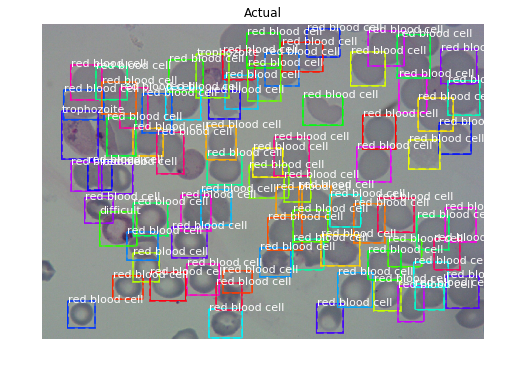

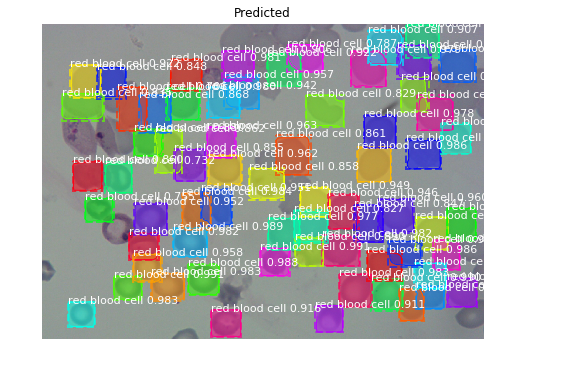

C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/06bbcd42-3ba8-4476-8804-8455f56dd928.jpg
Loading image:  [1211]   C:/Users/mukesh/Desktop/Applied AI/Projects/Case Study- Malaria bounding cases/Data/malaria-bounding-boxes/malaria/images/abb72ce2-4193-4dd3-a34c-61c2ee22ccff.jpg


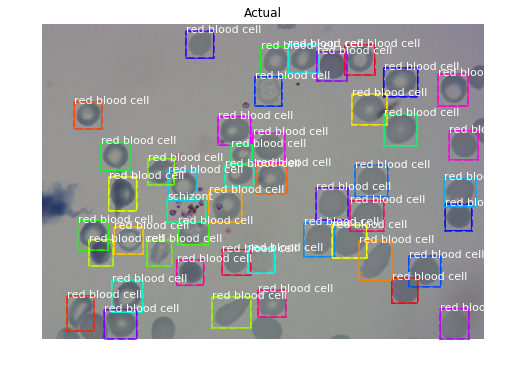

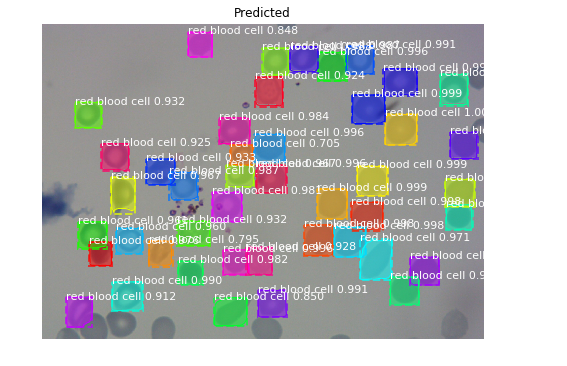

In [ ]:
# plot predictions for test dataset
plot_actual_vs_predicted(test_set, model_eval, config_pred,  n_images=4)

# 10. Evaluate MAP metrics for dataset

The performance of a model for an object recognition task is often evaluated using the mAP and IOU.

The mask-rcnn library provides a mrcnn.utils.compute_ap to calculate the AP and other metrics for a given images. These AP scores can be collected across a dataset and the mean calculated to give an idea at how good the model is at detecting objects in a dataset.

In [ ]:
# calculate the mAP for a model on a given dataset
def evaluate_model(dataset, model, cfg):
    APs = list()
    for image_id in dataset.image_ids:
        # load image, bounding boxes and masks for the image id
        image, image_meta, gt_class_id, gt_bbox, gt_mask = load_image_gt(dataset, cfg, image_id, use_mini_mask=False)
       # print(image, image_meta, gt_class_id, gt_bbox, gt_mask)
        # convert pixel values (e.g. center)
        scaled_image = mold_image(image, cfg)
        # convert image into one sample
        sample = expand_dims(scaled_image, 0)
        # make prediction
        yhat = model.detect(sample, verbose=0)
        # extract results for first sample
        r = yhat[0]
        #print(r)
        # calculate statistics, including AP
        """compute_ap: Compute Average Precision at a set IoU threshold (default 0.5).

            Returns:
            mAP: Mean Average Precision
            precisions: List of precisions at different class score thresholds.
            recalls: List of recall values at different class score thresholds.
            overlaps: [pred_boxes, gt_boxes] IoU overlaps.
            """
        #print( r["class_ids"])
        AP, _, _, _ = compute_ap(gt_bbox, gt_class_id, gt_mask, r["rois"], r["class_ids"], r["scores"], r['masks'])
        # store
        APs.append(AP)
    # calculate the mean AP across all images
    mAP = np.mean(APs)
    return mAP


In [ ]:
train_mAP = evaluate_model(train_set, model_eval, config_pred)

NameError: name 'evaluate_model' is not defined

In [ ]:
print("Train mAP: %.3f" % train_mAP)

Train mAP: 0.830


In [ ]:
# evaluate model on test dataset
test_mAP = evaluate_model(test_set,  model_eval, config_pred)

In [ ]:
print("Train mAP: %.3f" % test_mAP)

Train mAP: 0.806



# 11. Detect cells in new photos
I have downloaded some Malaria Cells image from internet and run model on these images.
These images are not part of training and test datasets.
Some, results are shown below.

In [ ]:

def detect_cells(path):
    # load image
    image = imread(path)
    plt.imshow(image)
    # convert pixel values (e.g. center)
    scaled_image = mold_image(image, config_pred)
    # convert image into one sample
    sample = expand_dims(scaled_image, 0)
    # make prediction
    yhat = model_eval.detect(sample, verbose=0)[0]
    r = yhat
    print(r['class_ids'])
    print( r['scores'])
    display_instances(image, r['rois'], r['masks'], r['class_ids'],
                                train_set.class_names, r['scores'],title="Predicted",figsize=(16, 16))


[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 5 1 1 1 1 1 1]
[0.98285323 0.9490067  0.90494525 0.88189155 0.87026995 0.85721314
 0.85267895 0.84942406 0.8333291  0.831059   0.8224382  0.81369245
 0.8104189  0.7802584  0.7724985  0.769569   0.75980395 0.73407376
 0.7316328  0.72611564 0.7180116  0.7155901  0.71262527 0.712349
 0.7003585 ]


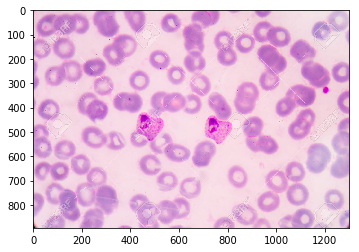

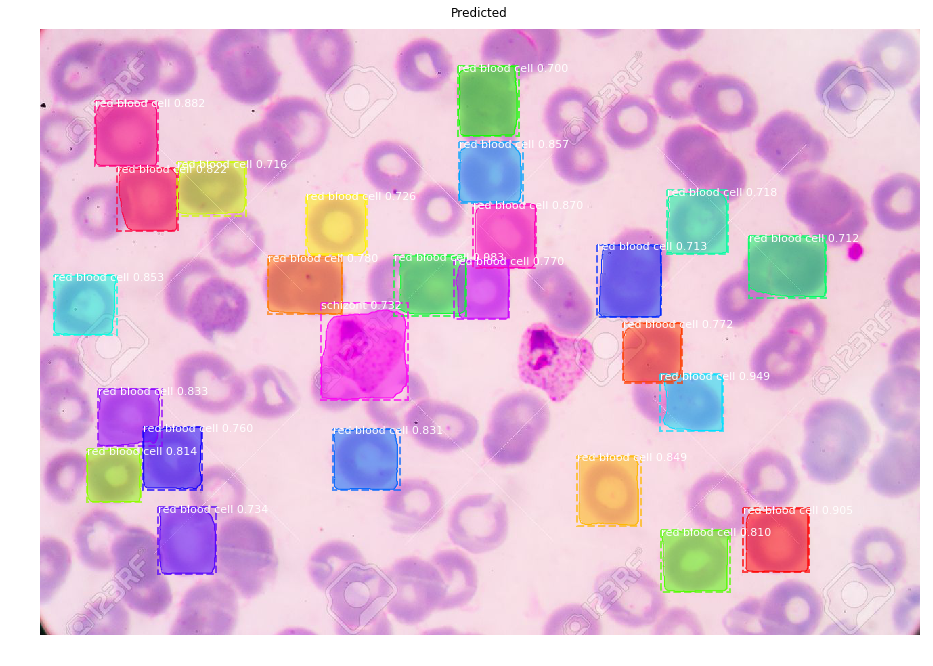

In [ ]:
detect_cells("C:/Users/mukesh/Pictures/Saved Pictures/mask-rcnn/new8.jpg")

#### In above image, our model detecting 24 Red blood cells and 1 schizonts with score 0.7316

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 5 1 1 2]
[0.9813958  0.97803557 0.9763692  0.9733508  0.9649282  0.9644976
 0.96368563 0.96258014 0.9595824  0.9562951  0.939252   0.93016136
 0.9267589  0.92569244 0.91195303 0.9079468  0.90220255 0.89297175
 0.88671523 0.8857458  0.8799423  0.8606073  0.8577857  0.855765
 0.811385   0.8094277  0.8082364  0.79895836 0.76888525 0.74270403
 0.74088126 0.721008  ]


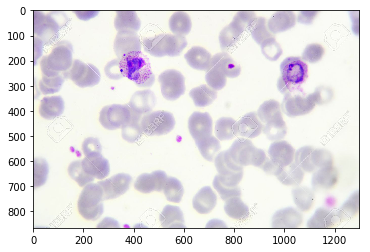

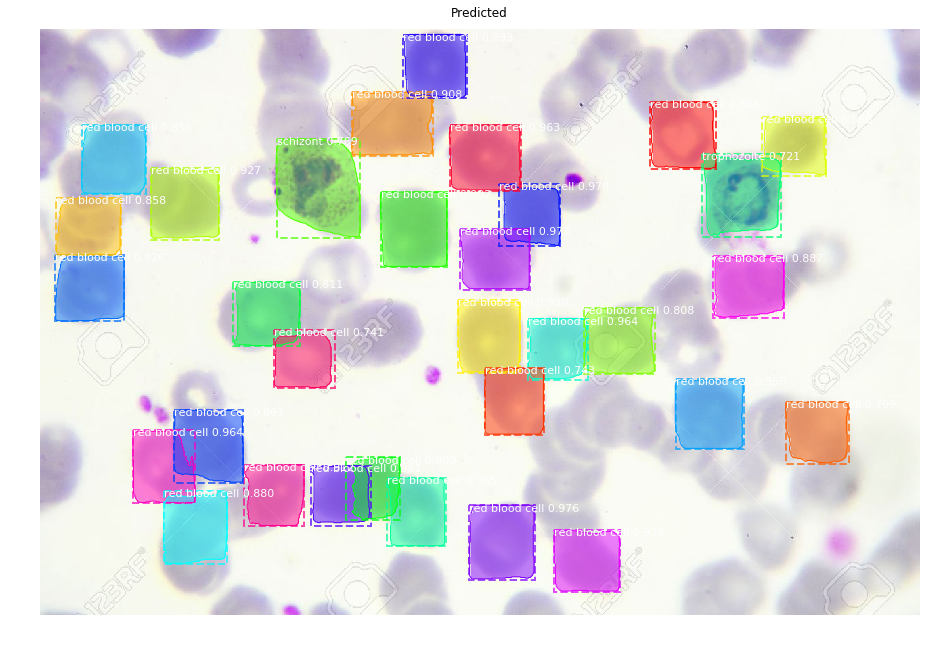

In [ ]:
detect_cells("C:/Users/mukesh/Pictures/Saved Pictures/mask-rcnn/new10.jpg")

#### In above image, our model detecting 30 Red blood cells and 1 schizonts with score 0.76888525 and 1 trophozoite with score 0.721008

# 11. Conclusion:

Mask- RCNN gives very good results.
We can compare actual and predicted image for masks, bounding box and class ids.

Learning: To train model using Mask -RCNN, it is very important and cruical to create dataset correctly in required format.

#### I have written a blog on this Case study. Link: https://medium.com/@nidhibansal1902/computer-vision-techniques-implementing-mask-r-cnn-on-malaria-cells-data-e03b9fbeb6be
